# This notebook creates maps of the perturbed O3 concentations in select years

#### Last modified March 2023
#### Written by E. McDuffie

In [2]:
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from mpl_toolkits.basemap import Basemap
import matplotlib.ticker as ticker
#import pycno
#import geopandas as gpd
from glob import glob
import numpy as np
import os
from netCDF4 import Dataset

print("The directory we are working in is {}" .format(os.getcwd()))

inputloc = 'Outputs - WebTool Air Quality Surfaces/2_AQS Grid/Full Globe/'

The directory we are working in is C:\Users\emcduf01\Environmental Protection Agency (EPA)\CSIB - General\Analysis\Methane-Ozone Mortality\External Collaboration\Web-Tool Inputs


In [3]:
#Create 0.5 x0.5 grid
lat05 = np.arange(-89.75, 90, 0.5)
lon05 = np.arange(-179.75, 180, 0.5)
yp,xp = np.meshgrid(lat05,lon05)

### Plot Absolute MDA8 O3 Perturbations from All Models

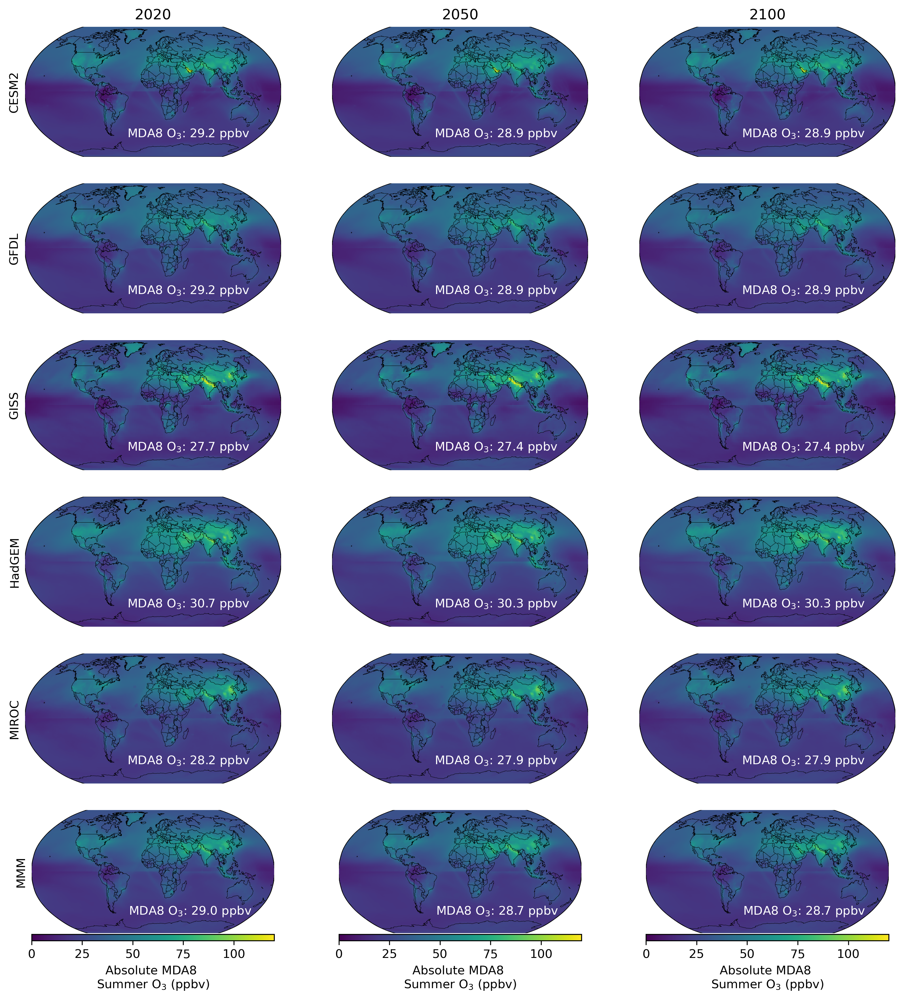

In [60]:
# Use this script to plot the absolute MDA8 O3 values (ppbv) from the Methane Pulse in 3 select years

list_of_files = ['Sim1_Sim2_Ozone CESM2_2020_Full Globe', 'Sim1_Sim2_Ozone CESM2_2050_Full Globe', 'Sim1_Sim2_Ozone CESM2_2100_Full Globe',
                'Sim1_Sim2_Ozone GFDL_2020_Full Globe', 'Sim1_Sim2_Ozone GFDL_2050_Full Globe', 'Sim1_Sim2_Ozone GFDL_2100_Full Globe',
                'Sim1_Sim2_Ozone GISS_2020_Full Globe', 'Sim1_Sim2_Ozone GISS_2050_Full Globe', 'Sim1_Sim2_Ozone GISS_2100_Full Globe',
                'Sim1_Sim2_Ozone HadGEM_2020_Full Globe', 'Sim1_Sim2_Ozone HadGEM_2050_Full Globe', 'Sim1_Sim2_Ozone HadGEM_2100_Full Globe',
                'Sim1_Sim2_Ozone MIROC_2020_Full Globe', 'Sim1_Sim2_Ozone MIROC_2050_Full Globe', 'Sim1_Sim2_Ozone MIROC_2100_Full Globe',
                'Sim1_Sim2_Ozone MMM_2020_Full Globe', 'Sim1_Sim2_Ozone MMM_2050_Full Globe', 'Sim1_Sim2_Ozone MMM_2100_Full Globe']
numplts=18
fig = plt.figure(dpi=300,figsize=(13,14))
for iplt in np.arange(0,numplts):
    #fig, axx = plt.subplots(1,3, dpi=300)
    #plotnum= int(str(33)+str(iplt+1))
    ax = fig.add_subplot(6,3,iplt+1)
    if iplt ==0:
        ax.set_title("2020")
    elif iplt ==1:
        ax.set_title("2050")
    elif iplt==2:
        ax.set_title("2100")
        
    zp = pd.read_csv(inputloc+list_of_files[iplt]+'.csv', index_col=['Row','Column']).to_xarray().Values
    #m = Basemap(projection='merc',llcrnrlat=-80,urcrnrlat=80,\
    #            llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c')
    m = Basemap(projection='robin',lon_0=0,resolution='c')
    m.drawmapboundary(fill_color='White')
    #m.fillcontinents(color='FloralWhite', lake_color='Azure',zorder=1)
    m.drawcoastlines(linewidth=0.25,zorder=3)
    #m.drawstates(linewidth=0.25,zorder=3)
    m.drawcountries(linewidth=0.25,zorder=3)
    xpi,ypi = m(xp,yp)
    plot = m.pcolor(xpi,ypi,zp.transpose(),  vmin=0, vmax=120, snap=True,zorder=2)
    
    
    if iplt >numplts-4:
        cb = m.colorbar(plot, location = "bottom", pad = "1%")
        tick_locator = ticker.MaxNLocator(nbins=5)
        cb.locator = tick_locator
        cb.update_ticks()
        cb.ax.set_xlabel('Absolute MDA8 \nSummer O$_3$ (ppbv)',fontsize=10)
        
    if ((iplt ==0) or (iplt==12)):
        plt.ylabel(list_of_files[iplt][16:21],fontsize=10)
    elif ((iplt == 3) or (iplt ==6)):
        plt.ylabel(list_of_files[iplt][16:20],fontsize=10)
    elif iplt==9:
        plt.ylabel(list_of_files[iplt][16:22],fontsize=10)
    elif iplt==15:
        plt.ylabel(list_of_files[iplt][16:19],fontsize=10)
        
    cb.ax.tick_params(labelsize=10)
    #add average O3 mixing ratio
    #style = dict(size=10, color='white')
    data= zp.to_pandas()
    strtext = 'MDA8 O$_3$: '+ str(round(np.mean(np.mean(data)),1))+ ' ppbv'
    #print(strtext)
    
    ax.annotate(strtext, xy=(0.40, 0.15), xycoords='axes fraction', 
               xytext=(0.40, 0.15), textcoords='axes fraction', color='white')
    #Titlestring = 'CESM Delta O3 2020'
    #fig1 = plt.gcf()
    #plt.title(Titlestring, fontsize=14);
plt.savefig('plot_absolute_perturbed_ozone.png', bbox_inches='tight')
plt.show();

In [46]:
data= zp.to_pandas()
print('O$_3$:',round(np.mean(np.mean(data)),1),'ppbv')

O$_3$: 29.2 ppbv


In [94]:
plt.savefig('plot_absolute_perturbed_ozone.png', bbox_inches='tight')

<Figure size 432x288 with 0 Axes>

### Plot Delta MDA8 O3 (pptv) from Methane Pulse

Sim1_Sim2_Ozone CESM2_2020_Full Globe <xarray.DataArray 'Values' ()>
array(10.52342015) <xarray.DataArray 'Values' ()>
array(90.74090007)
Sim1_Sim2_Ozone CESM2_2050_Full Globe <xarray.DataArray 'Values' ()>
array(34.90881295) <xarray.DataArray 'Values' ()>
array(1157.30956835)
Sim1_Sim2_Ozone CESM2_2100_Full Globe <xarray.DataArray 'Values' ()>
array(2.74660729) <xarray.DataArray 'Values' ()>
array(91.05190963)
Sim1_Sim2_Ozone GFDL_2020_Full Globe <xarray.DataArray 'Values' ()>
array(0.03967946) <xarray.DataArray 'Values' ()>
array(1.31047334)
Sim1_Sim2_Ozone GFDL_2050_Full Globe <xarray.DataArray 'Values' ()>
array(42.64382734) <xarray.DataArray 'Values' ()>
array(792.02589928)
Sim1_Sim2_Ozone GFDL_2100_Full Globe <xarray.DataArray 'Values' ()>
array(3.35795817) <xarray.DataArray 'Values' ()>
array(62.31618672)
Sim1_Sim2_Ozone GISS_2020_Full Globe <xarray.DataArray 'Values' ()>
array(0.05146813) <xarray.DataArray 'Values' ()>
array(0.90026427)
Sim1_Sim2_Ozone GISS_2050_Full Globe <xar

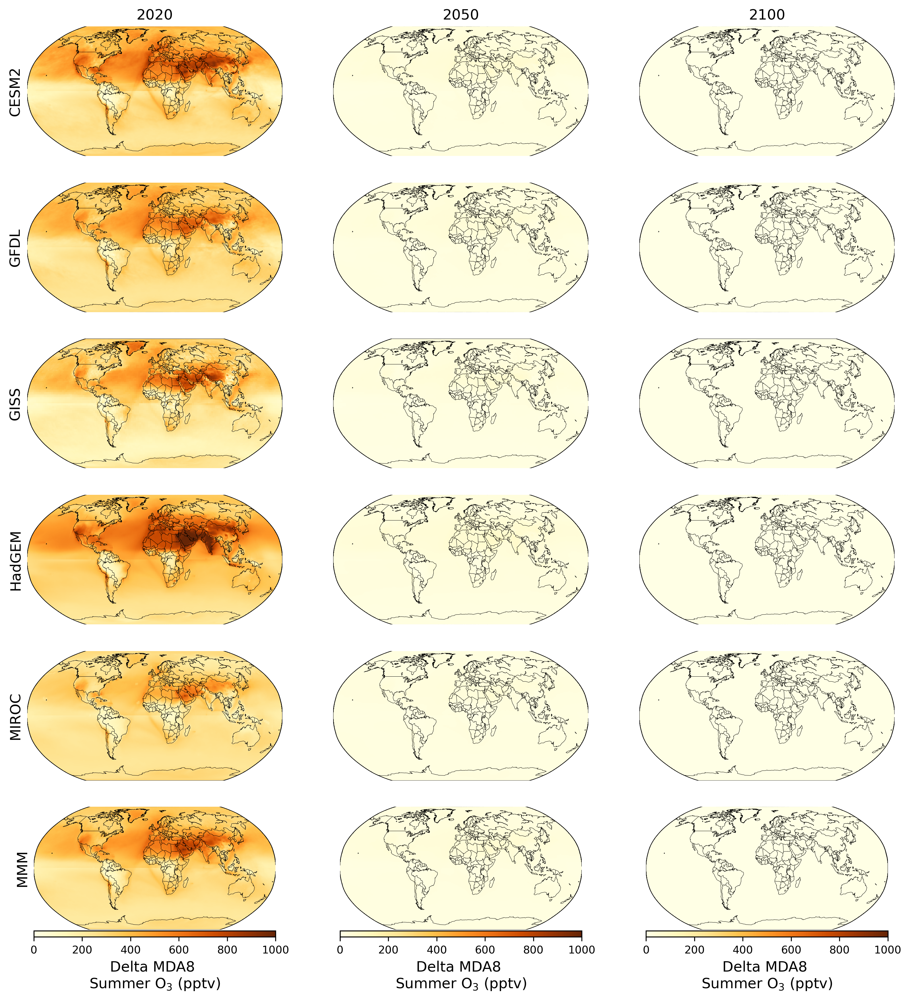

In [109]:
# Use this script to plot the absolute MDA8 O3 values (ppbv) from the Methane Pulse in 3 select years

list_of_files = ['Sim1_Sim2_Ozone CESM2_2020_Full Globe', 'Sim1_Sim2_Ozone CESM2_2050_Full Globe', 'Sim1_Sim2_Ozone CESM2_2100_Full Globe',
                'Sim1_Sim2_Ozone GFDL_2020_Full Globe', 'Sim1_Sim2_Ozone GFDL_2050_Full Globe', 'Sim1_Sim2_Ozone GFDL_2100_Full Globe',
                'Sim1_Sim2_Ozone GISS_2020_Full Globe', 'Sim1_Sim2_Ozone GISS_2050_Full Globe', 'Sim1_Sim2_Ozone GISS_2100_Full Globe',
                'Sim1_Sim2_Ozone HadGEM_2020_Full Globe', 'Sim1_Sim2_Ozone HadGEM_2050_Full Globe', 'Sim1_Sim2_Ozone HadGEM_2100_Full Globe',
                'Sim1_Sim2_Ozone MIROC_2020_Full Globe', 'Sim1_Sim2_Ozone MIROC_2050_Full Globe', 'Sim1_Sim2_Ozone MIROC_2100_Full Globe',
                'Sim1_Sim2_Ozone MMM_2020_Full Globe', 'Sim1_Sim2_Ozone MMM_2050_Full Globe', 'Sim1_Sim2_Ozone MMM_2100_Full Globe']
##Rainbow:
my_cmap = colors.LinearSegmentedColormap.from_list(name='my_cmap',colors=[
                '#6F4C9B','#DDAA3C', '#E49C39', '#E78C35', '#E67932', '#E4632D',
                '#DF4828', '#DA2222', '#B8221E', '#95211B', '#721E17',
                '#521A13'],N=3000)
#'#6F4C9B', '#6059A9', '#5568B8', '#4E79C5', '#4D8AC6',
#                '#4E96BC', '#549EB3', '#59A5A9', '#60AB9E', '#69B190',
#                '#77B77D', '#8CBC68', '#A6BE54', '#BEBC48', '#D1B541',
my_cmap._init()
slopen = 200
alphas_slope = np.abs(np.linspace(0, 1.0, slopen))
alphas_stable = np.ones(3003-slopen)
alphas = np.concatenate((alphas_slope, alphas_stable))
my_cmap._lut[:,-1] = alphas
my_cmap.set_under('gray', alpha=0)

    
numplts=18
        
fig = plt.figure(dpi=300, figsize=(13,14))
for iplt in np.arange(0,numplts):
    #fig, axx = plt.subplots(1,3, dpi=300)
    #plotnum= int(str(33)+str(iplt+1))
    ax = fig.add_subplot(6,3,iplt+1)
    if iplt ==0:
        ax.set_title("2020")
    elif iplt ==1:
        ax.set_title("2050")
    elif iplt==2:
        ax.set_title("2100")
    #calculate change relative to baseline simulation 
    if list_of_files[iplt][16:21].startswith('CES'):
        perturbed = pd.read_csv(inputloc+list_of_files[iplt]+'.csv', index_col=['Row','Column']).to_xarray().Values \
        - pd.read_csv(inputloc+'Sim1_Ozone CESM2_Baseline'+'.csv', index_col=['Row','Column']).to_xarray().Values
    elif list_of_files[iplt][16:21].startswith('GF'):
        perturbed = pd.read_csv(inputloc+list_of_files[iplt]+'.csv', index_col=['Row','Column']).to_xarray().Values \
        - pd.read_csv(inputloc+'Sim1_Ozone GFDL_Baseline'+'.csv', index_col=['Row','Column']).to_xarray().Values
    elif list_of_files[iplt][16:21].startswith('GI'):
        perturbed = pd.read_csv(inputloc+list_of_files[iplt]+'.csv', index_col=['Row','Column']).to_xarray().Values \
        - pd.read_csv(inputloc+'Sim1_Ozone GISS_Baseline'+'.csv', index_col=['Row','Column']).to_xarray().Values
    elif list_of_files[iplt][16:21].startswith('Had'):
        perturbed = pd.read_csv(inputloc+list_of_files[iplt]+'.csv', index_col=['Row','Column']).to_xarray().Values \
        - pd.read_csv(inputloc+'Sim1_Ozone HadGEM_Baseline'+'.csv', index_col=['Row','Column']).to_xarray().Values
    elif list_of_files[iplt][16:21].startswith('MIR'):
        perturbed = pd.read_csv(inputloc+list_of_files[iplt]+'.csv', index_col=['Row','Column']).to_xarray().Values \
        - pd.read_csv(inputloc+'Sim1_Ozone MIROC_Baseline'+'.csv', index_col=['Row','Column']).to_xarray().Values
    elif list_of_files[iplt][16:21].startswith('MM'):   
        perturbed = pd.read_csv(inputloc+list_of_files[iplt]+'.csv', index_col=['Row','Column']).to_xarray().Values \
        - pd.read_csv(inputloc+'Sim1_Ozone MMM_Baseline'+'.csv', index_col=['Row','Column']).to_xarray().Values
    
    print(list_of_files[iplt], np.min(zp), np.max(zp))
    zp = perturbed *1000 #covert to pptv
    
    #m = Basemap(projection='merc',llcrnrlat=-80,urcrnrlat=80,\
    #            llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c')
    m = Basemap(projection='robin',lon_0=0,resolution='c')
    m.drawmapboundary(fill_color='White')
    m.fillcontinents(color='FloralWhite', lake_color='Azure',zorder=1)
    m.drawcoastlines(linewidth=0.25,zorder=3)
    #m.drawstates(linewidth=0.25,zorder=3)
    m.drawcountries(linewidth=0.25,zorder=3)
    xpi,ypi = m(xp,yp)
    plot = m.pcolor(xpi,ypi,zp.transpose(), cmap='YlOrBr', vmin=0, vmax=1000, snap=True,zorder=2)

    
    if iplt >numplts-4:
        cb = m.colorbar(plot, location = "bottom", pad = "1%")
        tick_locator = ticker.MaxNLocator(nbins=5)
        cb.locator = tick_locator
        cb.update_ticks()
        cb.ax.set_xlabel('Delta MDA8 \nSummer O$_3$ (pptv)',fontsize=12)
    if ((iplt ==0) or (iplt==12)):
        plt.ylabel(list_of_files[iplt][16:21],fontsize=12)
    elif ((iplt == 3) or (iplt ==6)):
        plt.ylabel(list_of_files[iplt][16:20],fontsize=12)
    elif iplt==9:
        plt.ylabel(list_of_files[iplt][16:22],fontsize=12)
    elif iplt==15:
        plt.ylabel(list_of_files[iplt][16:19],fontsize=12)
        
    cb.ax.tick_params(labelsize=9)
    #add average change
    data= zp.to_pandas()
    strtext = '$\Delta$MDA8 O$_3$: '+ str(round(np.mean(np.mean(data)),1))+ ' pptv'
    #print(strtext)
    
    ax.annotate(strtext, xy=(0.40, 0.15), xycoords='axes fraction', 
               xytext=(0.40, 0.15), textcoords='axes fraction', color='black')
    #Titlestring = 'CESM Delta O3 2020'
    #fig1 = plt.gcf()
    #plt.title(Titlestring, fontsize=14);
plt.savefig('plot_delta_perturbed_ozone.png', bbox_inches='tight')
plt.show();

## Plot MDA8 for 2020 Only

Sim1_Sim2_Ozone CESM2_2020_Full Globe <xarray.DataArray 'Values' ()>
array(83.55657914) <xarray.DataArray 'Values' ()>
array(997.12971223)
Sim1_Sim2_Ozone GFDL_2020_Full Globe <xarray.DataArray 'Values' ()>
array(34.90881295) <xarray.DataArray 'Values' ()>
array(1157.30956835)
Sim1_Sim2_Ozone GISS_2020_Full Globe <xarray.DataArray 'Values' ()>
array(42.64382734) <xarray.DataArray 'Values' ()>
array(792.02589928)
Sim1_Sim2_Ozone HadGEM_2020_Full Globe <xarray.DataArray 'Values' ()>
array(24.65521583) <xarray.DataArray 'Values' ()>
array(939.71852518)
Sim1_Sim2_Ozone MIROC_2020_Full Globe <xarray.DataArray 'Values' ()>
array(75.18381295) <xarray.DataArray 'Values' ()>
array(1512.74748201)
Sim1_Sim2_Ozone MMM_2020_Full Globe <xarray.DataArray 'Values' ()>
array(73.3278777) <xarray.DataArray 'Values' ()>
array(928.08992806)


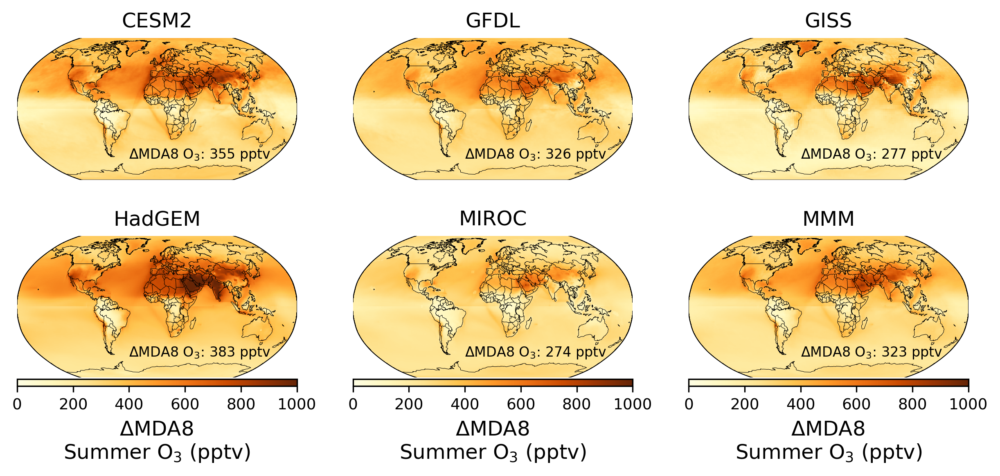

In [67]:
# Use this script to plot the absolute MDA8 O3 values (ppbv) from the Methane Pulse in 3 select years

list_of_files = ['Sim1_Sim2_Ozone CESM2_2020_Full Globe','Sim1_Sim2_Ozone GFDL_2020_Full Globe', \
                 'Sim1_Sim2_Ozone GISS_2020_Full Globe', 'Sim1_Sim2_Ozone HadGEM_2020_Full Globe', \
                 'Sim1_Sim2_Ozone MIROC_2020_Full Globe', 'Sim1_Sim2_Ozone MMM_2020_Full Globe']
##Rainbow:
my_cmap = colors.LinearSegmentedColormap.from_list(name='my_cmap',colors=[
                '#6F4C9B','#DDAA3C', '#E49C39', '#E78C35', '#E67932', '#E4632D',
                '#DF4828', '#DA2222', '#B8221E', '#95211B', '#721E17',
                '#521A13'],N=3000)
#'#6F4C9B', '#6059A9', '#5568B8', '#4E79C5', '#4D8AC6',
#                '#4E96BC', '#549EB3', '#59A5A9', '#60AB9E', '#69B190',
#                '#77B77D', '#8CBC68', '#A6BE54', '#BEBC48', '#D1B541',
my_cmap._init()
slopen = 200
alphas_slope = np.abs(np.linspace(0, 1.0, slopen))
alphas_stable = np.ones(3003-slopen)
alphas = np.concatenate((alphas_slope, alphas_stable))
my_cmap._lut[:,-1] = alphas
my_cmap.set_under('gray', alpha=0)

    
numplts=6
        
fig = plt.figure(dpi=300, figsize=(10,4))
for iplt in np.arange(0,numplts):
    #fig, axx = plt.subplots(1,3, dpi=300)
    #plotnum= int(str(33)+str(iplt+1))
    ax = fig.add_subplot(2,3,iplt+1)
    #if iplt ==0:
    #    ax.set_title("2020")
    #elif iplt ==1:
    #    ax.set_title("2050")
    #elif iplt==2:
    #    ax.set_title("2100")
    #calculate change relative to baseline simulation 
    if list_of_files[iplt][16:21].startswith('CES'):
        perturbed = pd.read_csv(inputloc+list_of_files[iplt]+'.csv', index_col=['Row','Column']).to_xarray().Values \
        - pd.read_csv(inputloc+'Sim1_Ozone CESM2_Baseline'+'.csv', index_col=['Row','Column']).to_xarray().Values
    elif list_of_files[iplt][16:21].startswith('GF'):
        perturbed = pd.read_csv(inputloc+list_of_files[iplt]+'.csv', index_col=['Row','Column']).to_xarray().Values \
        - pd.read_csv(inputloc+'Sim1_Ozone GFDL_Baseline'+'.csv', index_col=['Row','Column']).to_xarray().Values
    elif list_of_files[iplt][16:21].startswith('GI'):
        perturbed = pd.read_csv(inputloc+list_of_files[iplt]+'.csv', index_col=['Row','Column']).to_xarray().Values \
        - pd.read_csv(inputloc+'Sim1_Ozone GISS_Baseline'+'.csv', index_col=['Row','Column']).to_xarray().Values
    elif list_of_files[iplt][16:21].startswith('Had'):
        perturbed = pd.read_csv(inputloc+list_of_files[iplt]+'.csv', index_col=['Row','Column']).to_xarray().Values \
        - pd.read_csv(inputloc+'Sim1_Ozone HadGEM_Baseline'+'.csv', index_col=['Row','Column']).to_xarray().Values
    elif list_of_files[iplt][16:21].startswith('MIR'):
        perturbed = pd.read_csv(inputloc+list_of_files[iplt]+'.csv', index_col=['Row','Column']).to_xarray().Values \
        - pd.read_csv(inputloc+'Sim1_Ozone MIROC_Baseline'+'.csv', index_col=['Row','Column']).to_xarray().Values
    elif list_of_files[iplt][16:21].startswith('MM'):   
        perturbed = pd.read_csv(inputloc+list_of_files[iplt]+'.csv', index_col=['Row','Column']).to_xarray().Values \
        - pd.read_csv(inputloc+'Sim1_Ozone MMM_Baseline'+'.csv', index_col=['Row','Column']).to_xarray().Values
    
    print(list_of_files[iplt], np.min(zp), np.max(zp))
    zp = perturbed *1000 #covert to pptv
    
    #m = Basemap(projection='merc',llcrnrlat=-80,urcrnrlat=80,\
    #            llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c')
    m = Basemap(projection='robin',lon_0=0,resolution='c')
    m.drawmapboundary(fill_color='White')
    m.fillcontinents(color='FloralWhite', lake_color='Azure',zorder=1)
    m.drawcoastlines(linewidth=0.25,zorder=3)
    #m.drawstates(linewidth=0.25,zorder=3)
    m.drawcountries(linewidth=0.25,zorder=3)
    xpi,ypi = m(xp,yp)
    plot = m.pcolor(xpi,ypi,zp.transpose(), cmap='YlOrBr', vmin=0, vmax=1000, snap=True,zorder=2)

    
    if iplt >numplts-4:
        cb = m.colorbar(plot, location = "bottom", pad = "1%")
        tick_locator = ticker.MaxNLocator(nbins=5)
        cb.locator = tick_locator
        cb.update_ticks()
        cb.ax.set_xlabel('$\Delta$MDA8 \nSummer O$_3$ (pptv)',fontsize=12)
    if ((iplt ==0) or (iplt==4)):
        ax.set_title(list_of_files[iplt][16:21],fontsize=12)
    elif ((iplt == 1) or (iplt ==2)):
        ax.set_title(list_of_files[iplt][16:20],fontsize=12)
    elif iplt==3:
        ax.set_title(list_of_files[iplt][16:22],fontsize=12)
    elif iplt==5:
        ax.set_title(list_of_files[iplt][16:19],fontsize=12)
        
    cb.ax.tick_params(labelsize=9)
    #add average change
    data= zp.to_pandas()
    strtext = '$\Delta$MDA8 O$_3$: '+ str(round(np.mean(np.mean(data))))+ ' pptv'
    #print(strtext)
    
    ax.annotate(strtext, xy=(0.4, 0.15), xycoords='axes fraction', 
               xytext=(0.4, 0.15), textcoords='axes fraction', color='black', size = 8)
    #Titlestring = 'CESM Delta O3 2020'
    #fig1 = plt.gcf()
    #plt.title(Titlestring, fontsize=14);
plt.savefig('plot_delta_perturbed_ozone_2020.png', bbox_inches='tight')
plt.show();

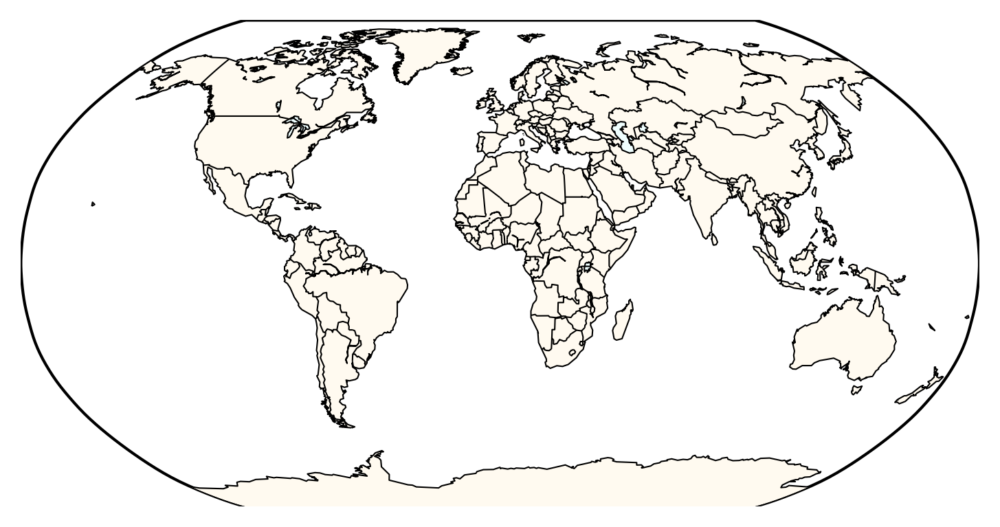

In [22]:
CESM1ds = pd.read_csv('Outputs - WebTool Air Quality Surfaces/2_AQS Grid/Full Globe/Sim1_Sim2_Ozone CESM2_2020_Full Globe.csv',index_col=['Row', 'Column']).to_xarray()
CESM2ds = pd.read_csv('Outputs - WebTool Air Quality Surfaces/2_AQS Grid/Full Globe/Sim1_Sim2_Ozone CESM2_2050_Full Globe.csv',index_col=['Row', 'Column']).to_xarray()
CESM3ds = pd.read_csv('Outputs - WebTool Air Quality Surfaces/2_AQS Grid/Full Globe/Sim1_Sim2_Ozone CESM2_2100_Full Globe.csv',index_col=['Row', 'Column']).to_xarray()

CESM3ds = pd.read_csv('Outputs - WebTool Air Quality Surfaces/2_AQS Grid/Full Globe/
area_file = Dataset('Outputs - WebTool Air Quality Surfaces/2_AQS Grid/Full Globe/Gridded_area_c01.nc')  
lon01 = np.array(area_file.variables['LON'])
lat01 = np.array(area_file.variables['LAT'])
fig, ax = plt.subplots(dpi=300)
#m = Basemap(projection='merc',llcrnrlat=-80,urcrnrlat=80,\
#            llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c')
m = Basemap(projection='robin',lon_0=0,resolution='c')
m.drawmapboundary(fill_color='White')
m.fillcontinents(color='FloralWhite', lake_color='Azure',zorder=1)
m.drawcoastlines(linewidth=0.5,zorder=3)
#m.drawstates(linewidth=0.25,zorder=3)
m.drawcountries(linewidth=0.5,zorder=3)
   

In [ ]:
 
        xpi,ypi = m(xp,yp)
        plot = m.pcolor(xpi,ypi,zp.transpose(), cmap=my_cmap, vmin=10**-15, vmax=scale_max, snap=True,zorder=2)
        cb = m.colorbar(plot, location = "bottom", pad = "1%")
        tick_locator = ticker.MaxNLocator(nbins=5)
        cb.locator = tick_locator
        cb.update_ticks()
    
        cb.ax.set_xlabel('Methane emissions (Mg a$^{-1}$ km$^{-2}$)',fontsize=10)
        cb.ax.tick_params(labelsize=10)
        Titlestring = str(year_range[iyear])+' '+title_str
        fig1 = plt.gcf()
        plt.title(Titlestring, fontsize=14);
        plt.show();
        if save_flag ==1:
            fig1.savefig(save_outfile+'_'+str(year_range[iyear])+'.tiff',transparent=False)

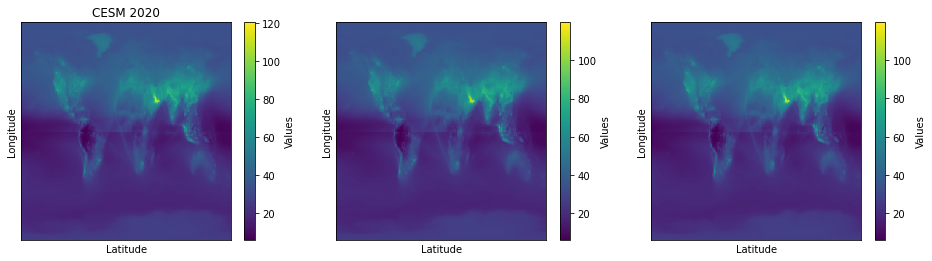

In [14]:
CESM1ds = pd.read_csv('Outputs - WebTool Air Quality Surfaces/2_AQS Grid/Full Globe/Sim1_Sim2_Ozone CESM2_2020_Full Globe.csv',index_col=['Row', 'Column']).to_xarray()
CESM2ds = pd.read_csv('Outputs - WebTool Air Quality Surfaces/2_AQS Grid/Full Globe/Sim1_Sim2_Ozone CESM2_2050_Full Globe.csv',index_col=['Row', 'Column']).to_xarray()
CESM3ds = pd.read_csv('Outputs - WebTool Air Quality Surfaces/2_AQS Grid/Full Globe/Sim1_Sim2_Ozone CESM2_2100_Full Globe.csv',index_col=['Row', 'Column']).to_xarray()

#csv/O3_metrics_GISS_Sim1_05x05_SUMMER_MDA8.csv', index_col=['Row', 'Col'])
#testds = testdf.to_xarray()
fig, axx = plt.subplots(1,3, figsize=(16, 4))
#ds.MDA8_NH.plot(ax=axx[0])
CESM1ds.Values.plot(ax=axx[0])
axx[0].set_title('CESM 2020')
CESM2ds.Values.plot(ax=axx[1])
CESM3ds.Values.plot(ax=axx[2])
#display(testds)

for ax in axx.flat:
    ax.set(xlabel='Longitude', ylabel='Latitude')
    ax.set_xticks([])
    ax.set_yticks([])

# Hide x labels and tick labels for top plots and y ticks for right plots.
for ax in axx.flat:
    ax.label_outer()

In [8]:
display(summerds)

<xarray.Dataset>
Dimensions:          (Col: 720, Row: 360)
Coordinates:
  * Row              (Row) int64 1 2 3 4 5 6 7 8 ... 354 355 356 357 358 359 360
  * Col              (Col) int64 1 2 3 4 5 6 7 8 ... 714 715 716 717 718 719 720
Data variables:
    Metric           (Row, Col) object 'D8HOURMAX' 'D8HOURMAX' ... 'D8HOURMAX'
    Seasonal Metric  (Row, Col) float64 nan nan nan nan nan ... nan nan nan nan
    Statistic        (Row, Col) float64 nan nan nan nan nan ... nan nan nan nan
    Values           (Row, Col) float64 26.38 26.38 26.38 ... 25.23 25.23 25.23

In [ ]:
griddf = gpd.read_file('shp/GMA_05x05.shp')

In [7]:
cno = pycno.cno()

In [35]:
paths = sorted(glob('/work/MOD3DEV/kseltzer/GMA/metrics/*/O3_metrics_*_Sim?_05x05.nc'))
dss = [xr.open_dataset(path) for path in paths]
ds = dss[0]

In [39]:
lats = np.array([ds.latitude.values for ds in  dss])
lons = np.array([ds.longitude.values for ds in  dss])
(lats[:1] == lats).all(), (lons[:1] == lons).all()

(True, True)

In [40]:
ds = xr.open_dataset('/work/MOD3DEV/kseltzer/GMA/metrics/GISS/O3_metrics_GISS_Sim1_05x05.nc')

In [41]:
summerdf = pd.read_csv('csv/O3_metrics_GISS_Sim1_05x05_SUMMER_MDA8.csv', index_col=['Row', 'Col'])
summerds = summerdf.to_xarray()
annualdf = pd.read_csv('csv/O3_metrics_GISS_Sim1_05x05_ANNUAL_MDA8.csv', index_col=['Row', 'Col'])
annualds = annualdf.to_xarray()

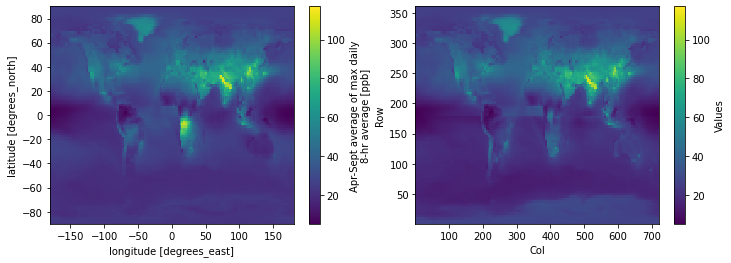

In [42]:
fig, axx = plt.subplots(1, 2, figsize=(12, 4))
ds.MDA8_NH.plot(ax=axx[0])
summerds.Values.plot(ax=axx[1])
#cno.draw(ax=axx[0])

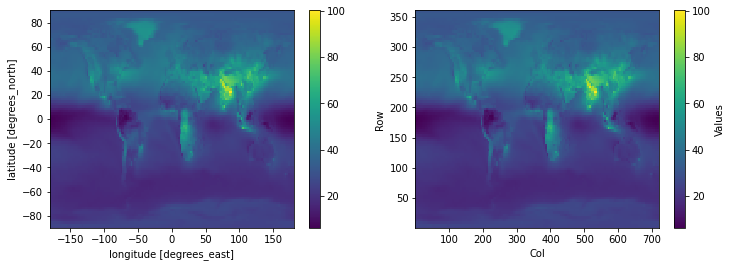

In [43]:
fig, axx = plt.subplots(1, 2, figsize=(12, 4))
((ds.MDA8_NH + ds.MDA8_SH) / 2).plot(ax=axx[0])
annualds.Values.plot(ax=axx[1])
#cno.draw()

<AxesSubplot:>

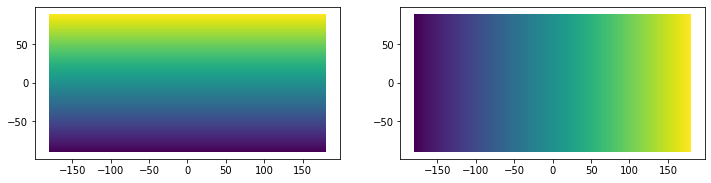

In [44]:
fig, axx = plt.subplots(1, 2, figsize=(12, 4))
griddf.plot('ROW', ax=axx[0])
griddf.plot('COL', ax=axx[1])